# BUCSS 2026
## AI Session Hands-On Part 1: Data Insights

In this notebook you will:
- Load observational data from weather station networks of different cities
- Visualize observations

In [1]:
import sys

import matplotlib.pyplot as plt
import pandas as pd

sys.path.insert(0, "../scripts")
from plotting import (
    obs_map,
    plot_diurnal_cycle,
    plot_diurnal_cycle_city_station,
    plot_lcz_based_observations,
    quick_raster_plot,
    station_surroundings,
    week_plot,
)

## First, let's decide which city you want to extract your data from:

In [2]:
city_dict = {
    1: {"city": "bern", "country":"switzerland", "initial_station": "CHE_BRN_log_101", "outskirt_station": "CHE_BRN_log_79"},
    2: {"city": "dortmund", "country":"germany", "initial_station": "DOBBHS", "outskirt_station": "DOTAMS"},
    3: {"city": "freiburg", "country":"germany", "initial_station": "DEU_FR_FRASHA", "outskirt_station": "DEU_FR_FREICH"},
    4: {"city": "ghent", "country":"belgium", "initial_station": "BEL_GNE_001", "outskirt_station": "BEL_GNE_006"},
}

# SELECT THE CITY YOU WANT TO INSPECT
selection = 1 # select 1, 2, 3, 4 as inidcated in the dictionary above

city = city_dict[selection]["city"]
country = city_dict[selection]["country"]
df = pd.read_parquet(f"../dataframes_for_training/{city}_training.parquet")
df["lcz_nearest"] = pd.to_numeric(df["lcz_nearest"], downcast="integer")

# add target variable that will be later used for training
df["temp_diff"] = df["air_temperature"] - df["t2m_corr"]

target = "temp_diff"  # "air_temperature"

df

,station_id,latitude,longitude,datetime_utc,air_temperature,bh_nearest,bh_buf50,bh_buf100,bh_buf250,bh_buf500,...,tp,u10,v10,sp,ssrd_deac,tp_deac,rh,wspd,t2m_corr,temp_diff
0,CHE_BRN_log_101,46.9351,7.4281,2019-05-14 22:00:00+00:00,7.98,0.0,0.0,0.00000,0.849057,2.560739,...,8.583069e-07,-1.721725,-1.542887,92412.3125,0.0,0.000000,67.882904,2.311891,4.555258,3.424742
1,CHE_BRN_log_101,46.9351,7.4281,2019-05-14 23:00:00+00:00,7.68,0.0,0.0,0.00000,0.849057,2.560739,...,8.583069e-07,-1.693878,-1.542974,92353.8750,0.0,0.000000,70.119926,2.291286,4.011312,3.668688
2,CHE_BRN_log_101,46.9351,7.4281,2019-05-15 00:00:00+00:00,6.98,0.0,0.0,0.00000,0.849057,2.560739,...,8.583069e-07,-1.733597,-1.486975,92329.0625,0.0,0.000000,73.180702,2.283955,3.530111,3.449889
3,CHE_BRN_log_101,46.9351,7.4281,2019-05-15 01:00:00+00:00,6.27,0.0,0.0,0.00000,0.849057,2.560739,...,0.000000e+00,-1.747345,-1.402138,92280.6250,0.0,0.000000,75.517906,2.240358,2.954916,3.315084
4,CHE_BRN_log_101,46.9351,7.4281,2019-05-15 02:00:00+00:00,5.55,0.0,0.0,0.00000,0.849057,2.560739,...,0.000000e+00,-1.816971,-1.263322,92230.4375,0.0,0.000000,78.982559,2.212999,2.390707,3.159293
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
643613,CHE_BRN_log_9,46.9503,7.4202,2022-09-15 17:00:00+00:00,16.81,0.0,0.0,0.22082,0.989801,4.212365,...,1.097335e-02,0.628616,0.792358,92217.6250,143296.0,0.000490,90.404404,1.011430,16.914072,-0.104072
643614,CHE_BRN_log_9,46.9503,7.4202,2022-09-15 18:00:00+00:00,16.81,0.0,0.0,0.22082,0.989801,4.212365,...,1.204133e-02,0.682098,0.026428,92226.2500,15438.0,0.001068,91.362625,0.682610,16.346201,0.463799
643615,CHE_BRN_log_9,46.9503,7.4202,2022-09-15 19:00:00+00:00,16.81,0.0,0.0,0.22082,0.989801,4.212365,...,1.344164e-02,0.491409,0.312485,92298.0625,0.0,0.001400,90.824150,0.582349,15.647470,1.162530
643616,CHE_BRN_log_9,46.9503,7.4202,2022-09-15 20:00:00+00:00,16.62,0.0,0.0,0.22082,0.989801,4.212365,...,1.462336e-02,0.901245,-0.022324,92328.0625,0.0,0.001182,93.920067,0.901522,15.001230,1.618770


## Inspect the available data

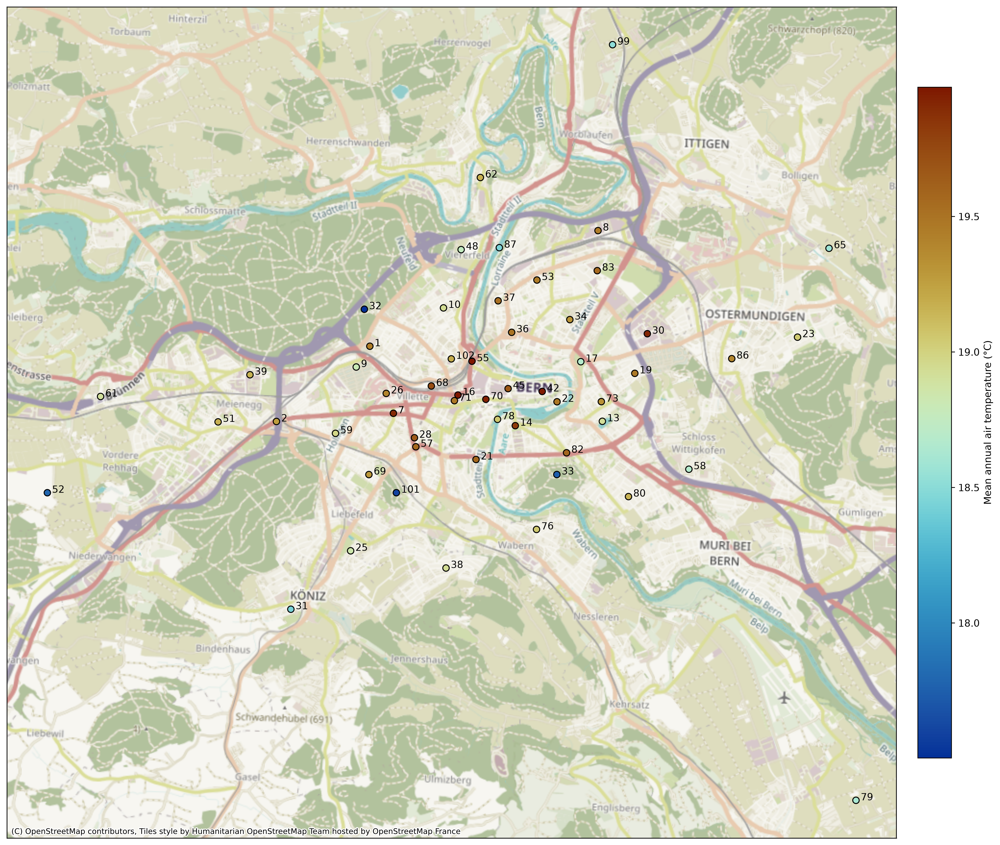

In [3]:
# Locate the stations and plot mean air temperature
fig, ax = obs_map(df.rename(columns={"air_temperature":"tmean"}).groupby("station_id").mean(), "tmean")

plt.show()

## Plot also the static descriptors of the city.

In [4]:
# Plot LCZ and DTM raster
# This information is not use completely during training, but extracted per station and stored in the dataframe
# quick_raster_plot(city, "lcz")
# quick_raster_plot(city, "dtm")

In [5]:
# Count available data per station

# Add additional info on month and year to simplify grouping
df["year"] = df["datetime_utc"].dt.year
df["month"] = df["datetime_utc"].dt.month

# group by station and year and count entries
df.groupby(["station_id", "year"]).size().reset_index(name="number_data_points")

,station_id,year,number_data_points
0,CHE_BRN_log_1,2019,2973
1,CHE_BRN_log_1,2020,2973
2,CHE_BRN_log_1,2021,2827
3,CHE_BRN_log_1,2022,2949
4,CHE_BRN_log_10,2019,2973
...,...,...,...
215,CHE_BRN_log_9,2022,2949
216,CHE_BRN_log_99,2019,2973
217,CHE_BRN_log_99,2020,2973
218,CHE_BRN_log_99,2021,2973


### Inspect the data availability across stations and years.

Here you can see which stations deliver many data and which stations have only a few observations. You can also see which years and months are covered by the data.
This could help you select stations for the training process, and discuss how the availability of data affects training and inference results.

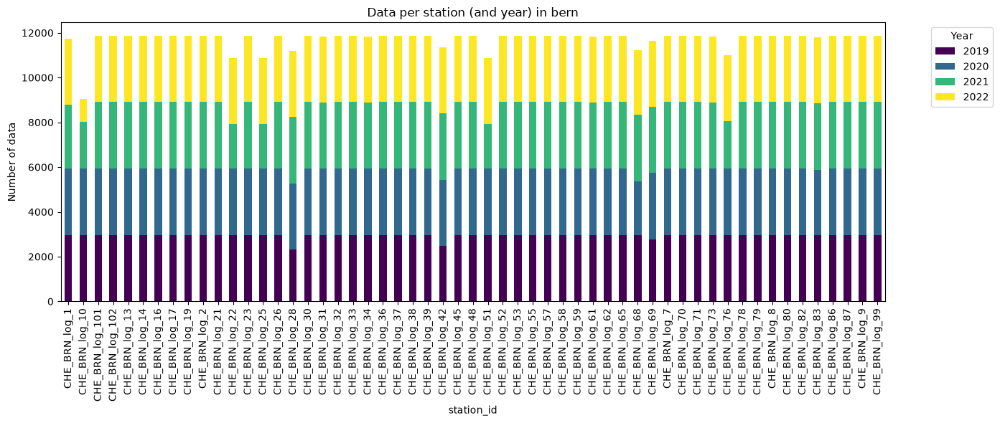

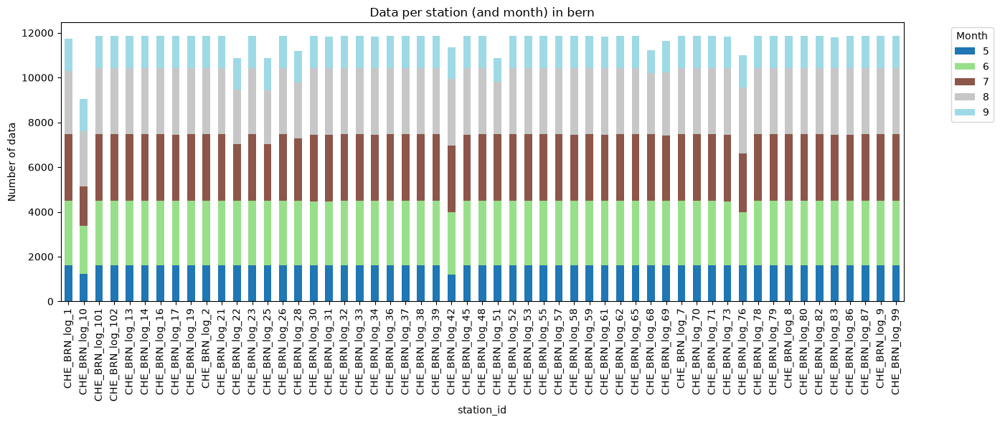

In [6]:
fig, ax = plt.subplots(figsize=(14, 6))

# Stacked barchart: Data per station (grouped by year)
df.groupby(["station_id", "year"]).size().reset_index(name="number_data_points").pivot(index="station_id", columns="year", values="number_data_points").fillna(0).plot(
    kind="bar", stacked=True, ax=ax, colormap="viridis"
)
ax.set_title(f"Data per station (and year) in {city}")
ax.set_ylabel("Number of data")
ax.legend(title="Year", bbox_to_anchor=(1.05, 1))

plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(14, 6))
# Stacked barchart: Data per station (grouped by month)
df.groupby(["station_id", "month"]).size().reset_index(name="number_data_points").pivot(index="station_id", columns="month", values="number_data_points").fillna(0).plot(
    kind="bar", stacked=True, ax=ax, colormap="tab20"
)
ax.set_title(f"Data per station (and month) in {city}")
ax.set_ylabel("Number of data")
ax.legend(title="Month", bbox_to_anchor=(1.05, 1))

plt.tight_layout()
plt.show()

### Now select a single station and plot the time series of air temperature.

In [7]:
df["station_id"].unique()

<ArrowStringArray>
['CHE_BRN_log_101', 'CHE_BRN_log_102',  'CHE_BRN_log_10',  'CHE_BRN_log_13',
  'CHE_BRN_log_14',  'CHE_BRN_log_16',  'CHE_BRN_log_17',  'CHE_BRN_log_19',
   'CHE_BRN_log_1',  'CHE_BRN_log_21',  'CHE_BRN_log_22',  'CHE_BRN_log_23',
  'CHE_BRN_log_25',  'CHE_BRN_log_26',  'CHE_BRN_log_28',   'CHE_BRN_log_2',
  'CHE_BRN_log_30',  'CHE_BRN_log_31',  'CHE_BRN_log_32',  'CHE_BRN_log_33',
  'CHE_BRN_log_34',  'CHE_BRN_log_36',  'CHE_BRN_log_37',  'CHE_BRN_log_38',
  'CHE_BRN_log_39',  'CHE_BRN_log_42',  'CHE_BRN_log_45',  'CHE_BRN_log_48',
  'CHE_BRN_log_51',  'CHE_BRN_log_52',  'CHE_BRN_log_53',  'CHE_BRN_log_55',
  'CHE_BRN_log_57',  'CHE_BRN_log_58',  'CHE_BRN_log_59',  'CHE_BRN_log_61',
  'CHE_BRN_log_62',  'CHE_BRN_log_65',  'CHE_BRN_log_68',  'CHE_BRN_log_69',
  'CHE_BRN_log_70',  'CHE_BRN_log_71',  'CHE_BRN_log_73',  'CHE_BRN_log_76',
  'CHE_BRN_log_78',  'CHE_BRN_log_79',   'CHE_BRN_log_7',  'CHE_BRN_log_80',
  'CHE_BRN_log_82',  'CHE_BRN_log_83',  'CHE_BRN_log_86',

<Axes: title={'center': 'air_temperature (at station CHE_BRN_log_101 in bern)'}, xlabel='datetime_utc'>

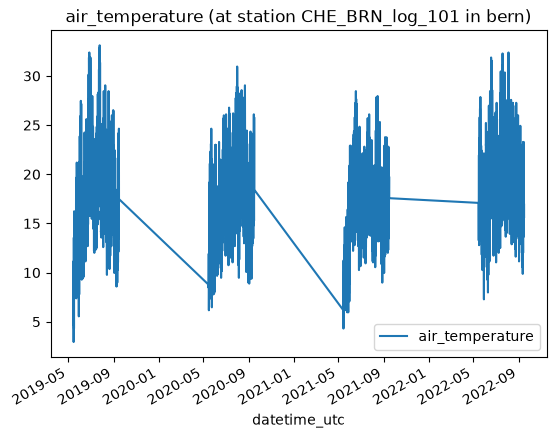

In [8]:
station = city_dict[selection]["initial_station"]

# UNCOMMENT THE FOLLOWING AND ENTER A SPECIFIC STATION ID FROM THE LIST ABOVE
# station = "CHE_BRN_log_8"

# PLOT DIFFERENT PARAMETERS ["temp_diff", "air_temperature"]
param = "air_temperature"
df[df["station_id"] == station].plot(x="datetime_utc", y=param, title=f"{param} (at station {station} in {city})")

### Plot surroundings of the selected stations

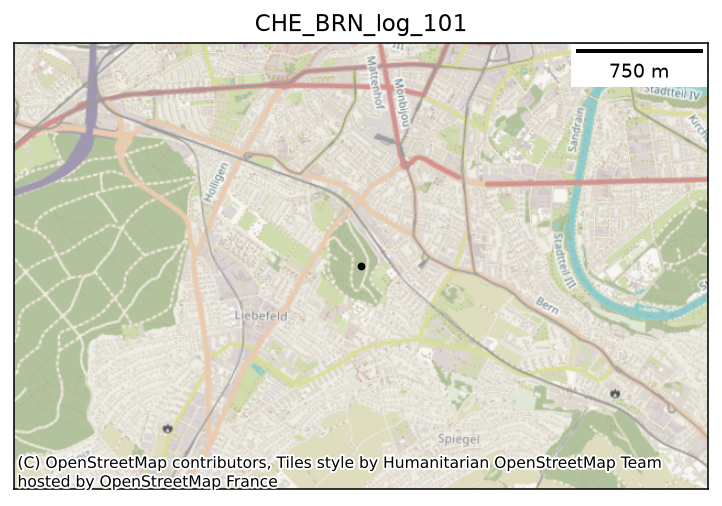

In [9]:
# create a plot for a station location
station_x = df[df["station_id"] == station].iloc[0]["longitude"]
station_y = df[df["station_id"] == station].iloc[0]["latitude"]
station_surroundings(station, station_y, station_x)

### Create a Weekly plot for the hottest week and plot the measurement from the warmest and coolest locations.

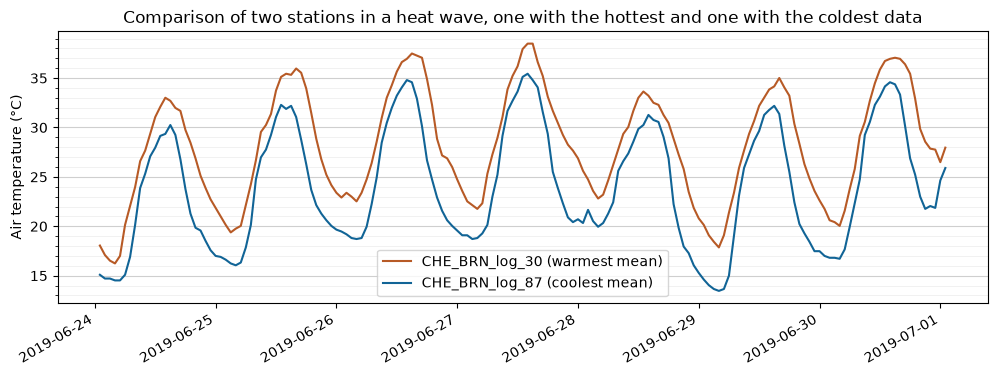

(<Figure size 1200x400 with 1 Axes>,
 <Axes: title={'center': 'Comparison of two stations in a heat wave, one with the hottest and one with the coldest data'}, ylabel='Air temperature (°C)'>)

In [10]:
# find the time with the absolute hottest temperature measured
hottest_time = df.loc[df["air_temperature"].idxmax(), "datetime_utc"]

# we set up a time window that is a week long, centered around the hottest time
half = pd.Timedelta(days=3.5)
lo, hi = hottest_time - half, hottest_time + half
window = df["datetime_utc"].between(lo, hi)

# filter to stations that have data during this hot week
in_window = df[window]

# observation count per station within the window
counts = in_window.groupby("station_id")["datetime_utc"].count()

# keep stations with >= 70% of the best-covered station's count
threshold = 0.5 * counts.max()
present_ids = counts[counts >= threshold].index

# mean temp per WELL-COVERED station during the window
stn = (in_window[in_window["station_id"].isin(present_ids)]
           .groupby("station_id")["air_temperature"].mean()
           .rename("tmean").reset_index())

hot_id  = stn.loc[stn["tmean"].idxmax(), "station_id"]
cold_id = stn.loc[stn["tmean"].idxmin(), "station_id"]

hot_week  = df[(df["station_id"] == hot_id)  & window].sort_values("datetime_utc")
cold_week = df[(df["station_id"] == cold_id) & window].sort_values("datetime_utc")

week_plot(hot_week, cold_week, hot_id, cold_id)

### Check the distribution based on local climate zones

<Figure size 1920x1440 with 0 Axes>

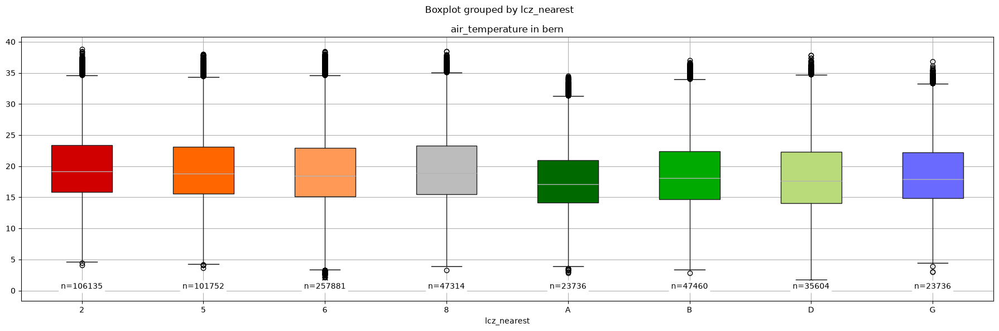

In [11]:
# print(f"Network of {city} covers the following LCZ classes: {covered_lcz_classes}")
plot_lcz_based_observations(df, city)

### Plot mean diurnal cycle of temp_diff

Here we use seaborn library for extended plotting facilities.
Check the documentation for the lineplot and errorbars here:
- https://seaborn.pydata.org/generated/seaborn.lineplot.html
- https://seaborn.pydata.org/tutorial/error_bars.html


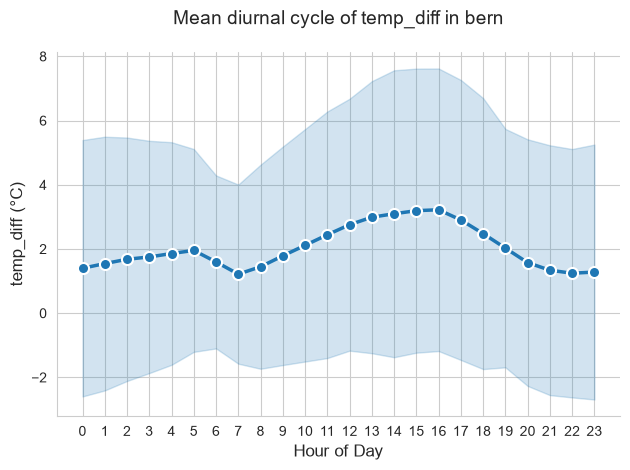

In [12]:
param = "temp_diff" # also works for "air_temperature" column

# As data is hourly, add hour as descriptor
df["hour"] = df["datetime_utc"].dt.hour

plot_diurnal_cycle(df, param, city)

### Plot mean diurnal cycle of temp_diff and for a certain station

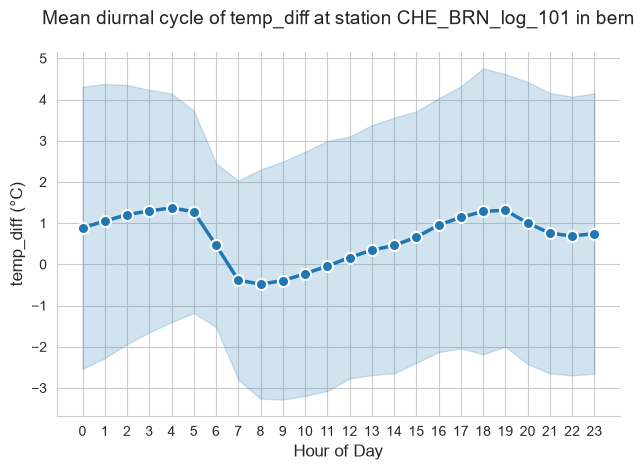

In [13]:
param = "temp_diff" # also works for "air_temperature" column

plot_diurnal_cycle(df[df["station_id"]==station], param, city, station)

### Now, also plot the diurnal cycle of a station against the full city

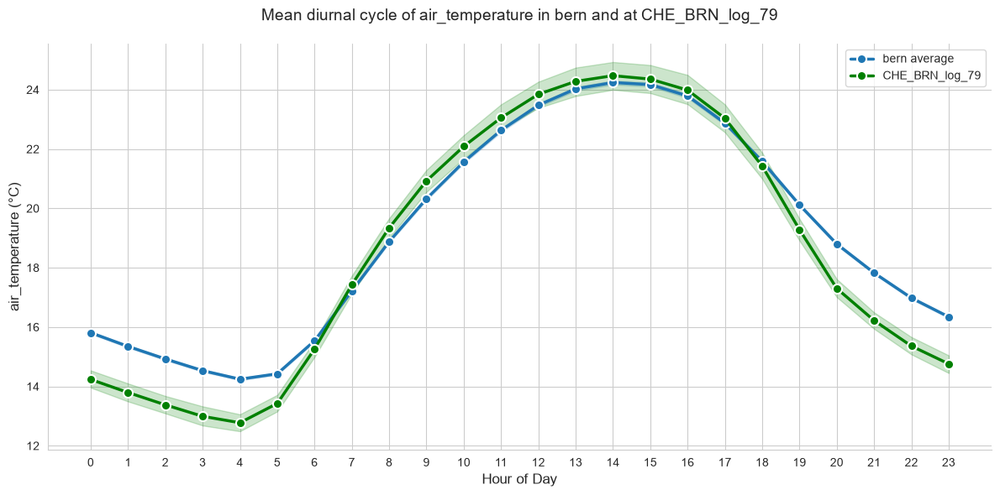

In [14]:
# use air_temperature initially for a better intuition of the station behaviour
param = "air_temperature" # also works for "temp_diff" column

# As data is hourly, add hour as descriptor
df["hour"] = df["datetime_utc"].dt.hour

# REPLACE WITH DIFFERENT STATIONS FROM THE MAP / ABOVE LIST
# EXPERIMENT WITH DIFFERENT STATIONS AT THE CITY CENTER VS OUTSKIRTS
station=city_dict[selection]["outskirt_station"]

plot_diurnal_cycle_city_station(df, param, city, station)